<a href="https://colab.research.google.com/github/Mavs1025/utak-munggo/blob/main/predict_bostonhousing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Connect to GCP

In [ ]:
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

Authenticated


In [ ]:
# configure GCP project
project_id = 'affable-doodad-306100'
!gcloud config set project {project_id}

Updated property [core/project].


## Stage Raw Data in GCS

In [ ]:
bucket_name = 'ifeelitcoming-bostonhousing'

In [ ]:
# Create a GCS bucket.
!gsutil mb gs://{bucket_name}

Creating gs://ifeelitcoming-bostonhousing/...


In [ ]:
# Navigate to the chapter folder and transfer the raw data to GCS.
!gsutil cp SP102_Boston.csv gs://{bucket_name}/raw-data/

CommandException: No URLs matched: Boston.csv


## Load Data into BigQuery for Analytics

In [ ]:
# Create a Dataset in BigQuery.
!bq mk boston

BigQuery error in mk operation: Dataset 'affable-doodad-306100:boston' already
exists.


In [ ]:
# Load raw data from GCS as a Table into the newly created BigQuery Dataset.
!bq --location=US load --autodetect --source_format=CSV boston.boston gs://{bucket_name}/raw-data/SP102_Boston.csv

Waiting on bqjob_r4f11acacfdc21814_000001784f0a6317_1 ... (1s) Current status: DONE   


In [ ]:
#	View created Table schema on BigQuery.
!bq show boston.boston

Table affable-doodad-306100:boston.boston

   Last modified             Schema             Total Rows   Total Bytes   Expiration   Time Partitioning   Clustered Fields   Labels  
 ----------------- --------------------------- ------------ ------------- ------------ ------------------- ------------------ -------- 
  20 Mar 09:49:46   |- int64_field_0: integer   3542         425040                                                                    
                    |- crim: float                                                                                                     
                    |- zn: float                                                                                                       
                    |- indus: float                                                                                                    
                    |- chas: integer                                                                                                   
     

## Exploratory Data Analysis

### Select dataset sample

The Table in BigQuery contains 506 rows. With this, we gonna use this dataset for data exploration, transformation and machine learning spot-checking.

In [ ]:
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

Authenticated


In [ ]:
# configure GCP project
project_id = 'affable-doodad-306100'
!gcloud config set project {project_id}

Updated property [core/project].


In [ ]:
import pandas as pd

In [ ]:
%%bigquery --project affable-doodad-306100 boston_df
SELECT
  * 
FROM
  `affable-doodad-306100.boston.boston`

In [ ]:
# Dataframe shape
print(boston_df.shape)
boston_df.head()

(3036, 15)


,int64_field_0,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,1,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,194,0.02187,60.0,2.93,0,0.401,6.800,9.9,6.2196,1,265,15.6,393.37,5.03,31.1
2,195,0.01439,60.0,2.93,0,0.401,6.604,18.8,6.2196,1,265,15.6,376.70,4.38,29.1
3,255,0.04819,80.0,3.64,0,0.392,6.108,32.0,9.2203,1,315,16.4,392.89,6.57,21.9
4,256,0.03548,80.0,3.64,0,0.392,5.876,19.1,9.2203,1,315,16.4,395.18,9.25,20.9


In [ ]:
# check column datatypes
boston_df.dtypes

int64_field_0      int64
crim             float64
zn               float64
indus            float64
chas               int64
nox              float64
rm               float64
age              float64
dis              float64
rad                int64
tax                int64
ptratio          float64
black            float64
lstat            float64
medv             float64
dtype: object

### Pandas Profiling

In [ ]:
# pandas profiling
!pip install pandas-profiling==2.7.1
from pandas_profiling import ProfileReport

Must restart runtime and run below select dataset sample

In [ ]:
# run report
profile_result = ProfileReport(boston_df)
# view the reort
profile_result.to_notebook_iframe()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Scale and Normalize Features

In [ ]:
# get rejected variables (i.e, attributes with high correlation)
rejected_vars = profile_result.get_rejected_variables

In [ ]:
# filter from attributes set
boston_df.drop(rejected_vars(), axis=1, inplace=True)

In [ ]:
# scale the dataframe values
from sklearn.preprocessing import minmax_scale

In [ ]:
dataset = pd.DataFrame(minmax_scale(boston_df), columns=boston_df.columns)

In [ ]:
# normalize the dataframe
from sklearn.preprocessing import Normalizer

In [ ]:
dataset = pd.DataFrame(Normalizer().fit(dataset).transform(dataset), columns=dataset.columns)

In [ ]:
# plot the histogram distribution of the variables
import matplotlib.pyplot as plt

In [ ]:
%matplotlib inline

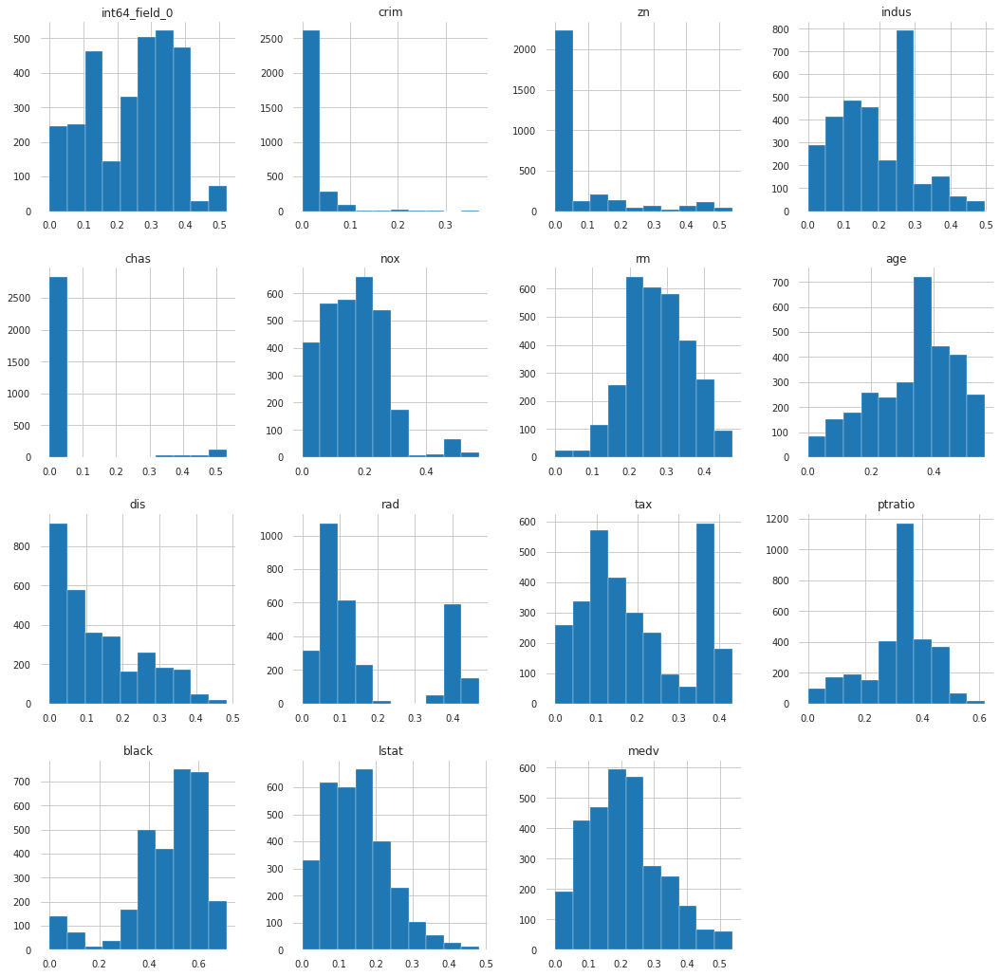

In [ ]:
dataset.hist(figsize=(18, 18))
plt.show()

## Spot Checking Machine Learning Algorithms

In [ ]:
# split features and labels
dataset_y = dataset['medv']
dataset_X = dataset.drop('medv', axis=1)

In [ ]:
# train-test split
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(dataset_X, dataset_y, shuffle=True)

In [ ]:
# spot-check ML algorithms
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from math import sqrt

In [ ]:
# create a dictionary of the candidate algorithms
ml_models = {
    'Linear Reg.': LinearRegression(),
    'Dec. Trees': DecisionTreeRegressor(),
    'Rand. Forest': RandomForestRegressor(),
    'SVM': SVR(),
    'XGBoost': XGBRegressor(),
    'NNets': MLPRegressor(warm_start=True, early_stopping=True, learning_rate='adaptive')
}

In [ ]:
# for each algorithm, train with the training set and evaluate on the hold-out test set
ml_results = {}
for name, model in ml_models.items():
    # fit model on training data
    model.fit(X_train, y_train)
    # make predictions for test data
    prediction = model.predict(X_test)
    # evaluate predictions
    rmse = sqrt(mean_squared_error(y_test, prediction))
    # append accuracy results to dictionary
    ml_results[name] = rmse
    print('RMSE: {} -> {}'.format(name, rmse))

RMSE: Linear Reg. -> 0.0358195598129762
RMSE: Dec. Trees -> 5.976466909403246e-05
RMSE: Rand. Forest -> 0.0017529324412281103
RMSE: SVM -> 0.05157927708813775
[09:36:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE: XGBoost -> 0.01596051951834116
RMSE: NNets -> 0.02022280533693162


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


In [ ]:
ml_results1 = list(ml_results)
ml_results2 = list(ml_results.values())
print(ml_results1)
print(ml_results2)

['Linear Reg.', 'Dec. Trees', 'Rand. Forest', 'SVM', 'XGBoost', 'NNets']
[0.0358195598129762, 5.976466909403246e-05, 0.0017529324412281103, 0.05157927708813775, 0.01596051951834116, 0.02022280533693162]


Text(0, 0.5, 'RMSE')

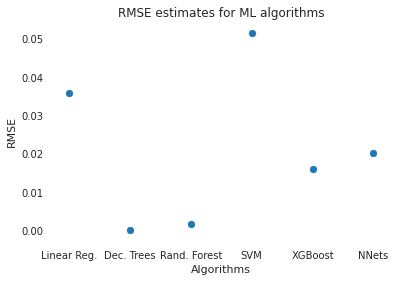

In [ ]:
# plots of the model performances 
plt.scatter(ml_results1, ml_results2)
# plt.plot(ml_results.keys(), ml_results.values(), 'o')
plt.title("RMSE estimates for ML algorithms")
plt.xlabel('Algorithms')
plt.ylabel('RMSE')

In [ ]:
raise Exception("Stop here")

Exception: ignored

Restart Runtime before running the cells below (Ctrl + M)




## Dataflow and Tensorflow Transform for Large Scale Data Processing

### At this point, change the Notebook runtime type to Python 2.0

In [ ]:
%%bash
source activate py2env
pip install --upgrade tensorflow
pip install --upgrade apache-beam[gcp]
pip install --upgrade tensorflow_transform==0.8.0
pip install --upgrade --force tensorflow_transform==0.8.0 apache-beam[gcp]
pip install tensorflow-transform
apt-get install libsnappy-dev
pip install --upgrade python-snappy==0.5.1

Requirement already up-to-date: tensorflow in /usr/local/lib/python3.7/dist-packages (2.4.1)
Requirement already up-to-date: apache-beam[gcp] in /usr/local/lib/python3.7/dist-packages (2.28.0)
Reading package lists...
Building dependency tree...
Reading state information...
libsnappy-dev is already the newest version (1.1.7-1).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.
Requirement already up-to-date: python-snappy==0.5.1 in /usr/local/lib/python3.7/dist-packages (0.5.1)


bash: line 1: activate: No such file or directory
ERROR: Could not find a version that satisfies the requirement tensorflow_transform==0.8.0 (from versions: 0.3.1, 0.4.0, 0.13.0, 0.14.0, 0.15.0, 0.21.0, 0.21.2, 0.22.0, 0.23.0, 0.24.0, 0.24.1, 0.25.0, 0.26.0, 0.27.0, 0.28.0)
ERROR: No matching distribution found for tensorflow_transform==0.8.0
ERROR: Could not find a version that satisfies the requirement tensorflow_transform==0.8.0 (from versions: 0.3.1, 0.4.0, 0.13.0, 0.14.0, 0.15.0, 0.21.0, 0.21.2, 0.22.0, 0.23.0, 0.24.0, 0.24.1, 0.25.0, 0.26.0, 0.27.0, 0.28.0)
ERROR: No matching distribution found for tensorflow_transform==0.8.0


In [ ]:
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

Authenticated


In the bucket_name, you must create buckets in the storage in GCP.

In [ ]:
project_id = 'affable-doodad-306100'
bucket_name = 'ifeelitcoming-bostonhousing'
tf_version = '1.8'
region = 'us-central1'

In [ ]:
!gcloud config set project {project_id}
!gcloud config set compute/region {region}

Updated property [core/project].
Updated property [compute/region].


In [ ]:
def create_query(phase, EVERY_N=None):
  """
  EVERY_N: INTEGER. Sample one out of every N rows from the full dataset larger values will yield
  phase: 1=train 2=valid
  """
  base_query = """
  SELECT
  * 
  FROM
  `affable-doodad-306100.mavs_sandbox.boston`
  """

In [ ]:
%%writefile requirements.txt
tensorflow-transform==0.8.0

Overwriting requirements.txt


### Apache Beam to build a data processing pipeline to transform the raw dataset into a form of suitable for building a predictive model.

In [ ]:
import datetime
import snappy
import tensorflow as tf
import apache_beam as beam
import tensorflow_transform as tft
from tensorflow_transform.beam import impl as beam_impl

def get_table_header(projection_fields):
  header = ''
  for cnt, val in enumerate(projection_fields):
    if cnt > 0:
      header+=','+val
    else:
      header+=val
    return header

def preprocess_tft(inputs):
  results = {}
  for attr, value in inputs.items():
    results[attr] = tft.scale_to_0_1(value)
  
  return results

If the cell above returns an error, just restart runtime once more and run it from 'Data and Tensorflow Transform for Large Scale Data Processing'

In [ ]:
def cleanup(rowdict):
  CSV_COLUMNS = 'int64_field_0', 'crim', 'zn', 'indus', 'chas', 'nox', 'rm', 'age', 'dis','rad', 'tax', 'ptratio', 'black', 'lstat', 'medv'

  def tofloat(value, ifnot):
    try:
      return float(value)
    except (ValueError, TypeError):
      return ifnot
    
  results = {
      k : tofloat(rowdict[k], -99) if k in rowdict else -99 for k in CSV_COLUMNS
  }

  row = ('{}'+',{}'*(len(results)-1)).format(results['int64_field_0'], results['crim'], results['zn'], results['indus'], 
                                             results['chas'], results['nox'], results['rm'], results['age'], results['dis'], 
                                             results['rad'], results['tax'], results['ptratio'], results['black'], 
                                             results['lstat'], results['medv'])

  yield row


## Training on Cloud MLE

In [ ]:
project_id = 'affable-doodad-306100'
bucket_name = 'ifeelitcoming-bostonhousing'
tf_version = '1.8'
region = 'us-central1'

In [ ]:
import os
os.environ['bucket_name'] = bucket_name
os.environ['tf_version'] = tf_version
os.environ['project_id'] = project_id
os.environ['region'] = region

###Training Source Files

In [ ]:
import os
try:
  os.makedirs('./trainer')
  # print('directory created')
except OSError:
  print('could not create directory')

could not create directory


In [ ]:
# %%writefile trainer/__init__.py

In [ ]:
%%writefile trainer/__init__.py
%%writefile trainer/task.py
import argparse
import json
import os

import tensorflow as tf
from tensorlow.contrib.training.python.training import hparam

import trainer.model as model

def _get_session_config_from_env_var():
  """Return a tf.ConfigProto instance that has appropriate device_filters set.
  """

  tf_config = json.loads(os.environ.get('TF_CONFIG', '{}'))

  if (tf_config and 'task' in tf_config and 'task' in tf_config['task'] and 'index' in tf_config['task']):
    # Master shoud only communicate with itself and ps
    if tf_config['task']['type'] == 'master':
      return tf.ConfigProto(device_filters=['/job:ps', '/job:master'])
    # Master shoud only communicate with itself and ps
    if tf_config['task']['type'] == 'worker':
      return tf.ConfigProto(device_filters=[
         '/job:ps',
         '/job:worker/task:%d' % tf_config['task']['index']
      ])
    
    return None

Overwriting trainer/__init__.py


In [ ]:
def train_and_evaluate(hparams):
  """Run the training and evaluate the high level API"""

  train_input = lambda: model.input_fn(
      tf.gfile.Glob(hparams.train_files),
      num_epochs=hparams.num_epochs,
      batch_size=hparams.train_batch_size
  )

  # Don't shuffle evaluation data
  eval_input = lambda: model.input_fn(
      tf.gfile.Glob(hparams.eval_files),
      batch_size=hparams.eval_batch_size,
      shuffle=False
  )

  train_spec = tf.estimator.TrainSpec(
      train_input, max_steps = hparams.train_steps)
  
  exporter = tf.estimator.TrainSpec(
      'boston', model.SERVING_FUNCTIONS(hparams.export_format))
  eval_spec = tf.estimator.EvalSpec(
      eval_input,
      steps=hparams.eval_steps,
      exporters=[exporter],
      name='boston-eval')
  
  run_config = tf.estimator.RunConfig(
      session_config=_get_session_config_from_env_var())
  run_config = run_config.replace(model_dir=hparams.job_dir)
  print('Model Dir %s' % run_config.model_dir)
  estimator = model.build_estimator(
      learning_rate=hparams.learning_rate,
      hidden_units=[
          max(2, int(hparams.first_layer_size * hparams.scale_factor**i))
          for i in range(hparams.num_layers)
      ],
      config=run_config,
      output_dir=hparams.output_dir)

  tf.estimator.train_and_evaluate(estimator, train_spec, eval_spec)

In [ ]:
import argparse
if __name__ == "__main__":
  parser = argparse.ArgumentParser()
  # Input Arguments
  parser.add_argument(
      '--train-files',
      help='GCS file or local paths to training data',
      nargs='+',
      # update the bucket_name
      default='gs://{}/preproc_csv/data/{}*'.format('ihatethissomuch-bostonhousing', tf.estimator.ModeKeys.TRAIN))
  parser.add_argument(
      '--eval-files',
      help='GCS file or local paths to evaluation data',
      nargs='+',
      # update the bucket_name 
      default='gs://{}/preproc_csv/data/{}*'.format('ihatethissomuch-bostonhousing', tf.estimator.ModeKeys.EVAL))
  parser.add_argument(
      '--job-dir',
      help='GCS location to write checkpoints and export models',
      default='/tmp/boston-estimator')
  parser.add_argument(
      '--num-epochs',
      help="""\
      Maximum number of training epochs on which to train.
      If both --max-steps and --num-epochs are specified,
      the training job will run for --max-steps or --num-epochs,
      whichever occurs first. If unspecified will run the --max-steps.\
      """, 
      type=int)

In [ ]:
%%writefile trainer/model.py
import six

import tensorflow as tf
from tensorflow.python.estimator.model_fn import ModeKeys as Modes

# Define the format of your input data including unused columns
CSV_COLUMNS = ['int64_field_0', 'crim', 'zn', 'indus', 'chas', 'nox', 'rm', 'age', 'dis','rad', 'tax', 'ptratio', 'black', 'lstat', 'medv']

CSV_COLUMNS_DEFAULTS = [[0.0] for i in range (0, len(CSV_COLUMNS))]
LABEL_COLUMN = 'medv'

#Define the initial ingestion of each feature used by your model
#Additionally, provide a metadata about the feature

INPUT_COLUMNS = [tf.feature_column.numeric_column(i) for i in CSV_COLUMNS[:-1]]

Overwriting trainer/model.py


In [ ]:
def build_estimator(config, output_dir, hidden_units=None, learning_rate=None):
  """
  Deep NN Regression Model.
  Args:
    config: (tf.contrib.learn.RunConfig) defining the runtime environment for
      the estimator (inclulding model_dir).
    hidden_units: [int] the layer sizes of the DNN (input layer first).
    learning_rate: [int] the learning rate for the optimizer.
  
  Return:
    A DNNRegressor
  """
  (int64_field_0, crim, zn, indus, chas, nox, rm, age, dis,rad, tax, ptratio, black, lstat, medv) = INPUT_COLUMNS

  columns = [int64_field_0, crim, zn, indus, chas, nox, rm, age, dis,rad, tax, ptratio, black, lstat, medv]

  estimator = tf.estimator.DNNRegressor(
      model_dir=output_dir,
      config=config,
      feature_columns=columns,
      hidden_units=hidden_units or [256, 128, 64],
      optimizer=tf.train.AdamOptimizer(learning_rate)
  )


In [ ]:
def add_eval_metrics(labels, predictions):
  pred_values = predictions['predictions']
  return {
      'rmse': tf.metrics.root_mean_squared_error(labels, pred_values)
  }

  # [START] Serving Function

def csv_input_serving_fn():
  """Build the serving inputs."""
  csv_row = tf.placeholder(shape=[None], dtype=tf.string)
  features = _decode_csv(csv_row)
  # Ignore label columns
  features.pop(LABEL_COLUMN)
  return tf.estimator.export.ServingInputReceiver(features,
                                                  {'csv_row':csv_row})
    
def example_input_serving_fn():
  """Build the serving inputs."""
  example_bytestring = tf.placeholder(shape=[None], dtype=tf.string)
  features = tf.parse_example(
      example_bytestring,
      tf.feature_column.make_parse_example_spec(INPUT_COLUMNS))
  return tf.estimator.export.ServingInputReceiver(features,
                                                  {'example_proto':example_bytestring})

def json_input_serving_fn():
  """Build the serving inputs."""
  inputs = {}
  for feat in INPUT_COLUMNS:
    inputs[feat.name] = tf.placeholder(shape=[None], dtype=feat.dtype)
  
  return tf.estimator.export.ServingInputReceiver(inputs, inputs)

In [ ]:
SERVING_FUNCTIONS = {
    'JSON': json_input_serving_fn,
    'EXAMPLE': example_input_serving_fn,
    'CSV': csv_input_serving_fn
}

def _decode_csv(line):
  """Takes the string input tensor and return a dict of rank-2 tensors."""

  # takes a rank-1 tensor and converts it into rank-2 tensors
  row_columns = tf.expand_dims(line, -1)
  columns = tf.decode_csv(row_columns, record_defaults=CSV_COLUMN_DEFAULTS)
  features = dict(zip(CSV_COLUMNS, columns))

  # remove unused columns
  for col in UNUSED_COLUMNS:
    features.pop(col)
  return features

def input_fn(filenames, num_epochs=None, shuffle=True, skip_header_lines=1, batch_size=200):
  """Generates features and labels for training or evaluation.
  This uses the input pipeline base approach using queue
  to read data so that entire data is not loaded in memory.
  Args:
    filesnames: [str] A list of CSV file(s) to read the data from.
    num_epochs: [int] how many time through to read the data. If none will loop through data indefinitely.
    shuffle: [bool] whether or not to randomize the order of data. Controls from randomization 
             of both file order and line order within files.
    skip_header_line: [int] set to non-zero in order to skip order to skip header lines in CSV files.
    batch_size: [int] First dimension size of the tensors returned by input_fn
  Returns:
    A (features, indices) tuple where features is a dictionary of Tensors, and indices is a single Tensors
    of label indices.
  """
  dataset = tf.data.TextLineDataset(filenames).skip(skip_header_lines).map(_decode_csv)

In [ ]:
%%writefile hptuning_config.yaml
trainingInput:
  hyperparameters:
    hyperparameterMetricTag: rmse
    goal: MINIMIZE
    maxTrials: 4 
    maxParallelTrials: 2 
    enableTrialEarlyStopping: True
    algorithm: RANDOM_SEARCH
    params:
      - parameterName: learning-rate
        type: DOUBLE
        minValue: 0.00001
        maxValue: 0.005
        scaleType: UNIT_LOG_SCALE
      - parameterName: first-layer-size
        type: INTEGER
        minValue: 50
        maxValue: 500
        scaleType: UNIT_LINEAR_SCALE
      - parameterName: num-layers
        type: INTEGER
        minValue: 1
        maxValue: 15
        scaleType: UNIT_LINEAR_SCALE
      - parameterName: scale-factor
        type: DOUBLE
        minValue: 0.1
        maxValue: 1.0
        scaleType: UNIT_REVERSE_LOG_SCALE

Overwriting hptuning_config.yaml


### Train Distributed

In [ ]:
%%bash
# run training job
JOB_NAME=boston_$(date -u +%y%m%d_%H%M%S)
HPTUNING_CONFIG=hptuning_config.yaml
GCS_JOB_DIR=gs://$bucket_name/job/$JOB_NAME

echo $GCS_JOB_DIR

gcloud ai-platform jobs submit training $JOB_NAME \
                                    --stream-logs \
                                    --runtime-version $tf.version \
                                    --job-dir $GCS_JOB_DIR \
                                    --module-name trainer.task \
                                    --package-path trainer/ \
                                    --region $region \
                                    --scale-tier=STANDARD_1 \
                                    --config $HPTUNING_CONFIG \
                                    -- \
                                    --train-steps 5000 \
                                    --eval-steps 100


gs://ifeelitcoming-bostonhousing/job/boston_210320_095223


ERROR: (gcloud.ai-platform.jobs.submit.training) Non-custom jobs must have packages.
bash: line 15: --job-dir: command not found


In [ ]:
raise Exception("Stop here")

In [ ]:
%%bash
# run training job
JOB_NAME=boston_$(date -u +%y%m%d_%H%M%S)
HPTUNING_CONFIG=hptuning_config.yaml
# GCS_JOB_DIR=gs://$bucket_name/job/$JOB_NAME
JOB_DIR=gs://$bucket_name/job-dir/$JOB_NAME

# echo $GCS_JOB_DIR
echo $JOB_DIR

gcloud ai-platform jobs submit training $JOB_NAME \
                                    --stream-logs \
                                    --runtime-version $tf.version \
                                    --job-dir $JOB_DIR \
                                    # --job-dir $GCS_JOB_DIR \
                                    --module-name trainer.task \
                                    --package-path trainer/ \
                                    --region us-central1 \
                                    --scale-tier=STANDARD_1 \
                                    --config $HPTUNING_CONFIG \
                                    -- \
                                    --train-steps 5000 \
                                    --eval-steps 100


## Deployed Trained Model

In [ ]:
%%bash
gsutil ls gs://$bucket_name/job/boston_210320_095223/

CommandException: One or more URLs matched no objects.


In [ ]:
%%bash
MODEL_NAME='boston'
MODEL_VERSION='v1'
MODEL_LOCATION=gs://$bucket_name/job/boston_210320_071459/3/

echo 'Deploying Model $MODEL_NAME $MODEL_VERSION'
gcloud ai-platform models create ${MODEL_NAME} regions us-central1
gcloud ai-platform versions create ${MODEL_VERSION} --model ${MODEL_NAME} --origin ${MODEL_LOCATION}

## Batch Prediction

In [ ]:
%%bash
JOB_NAME = boston_prediction
MODEL_NAME = boston
MODEL_VERSION = v1
TEST_FILE = gs://bucket_name/preproc_csv/data/eval-0-of-01.csv
OUTPUT_DIR = gs://bucket_name/jobs/JOB_NAME/predictions

echo OUTPUT_DIR

#submit a batched job

gcloud ai-platform jobs submit prediction JOB_NAME \
        --model MODEL_NAME \
        --version MODEL_VERSION \ 
        --data-format TEXT \
        --region region \
        --input-paths TEST_FILE \
        --output-paths OUTPUT_DIR  

#stream job logs
echo 'Job logs...'
gcloud ai-platform jobs stream-logs JOB_NAME

In [ ]:
#List the contents of the prediction output directory in GCS
%%bash
gsutil ls gs://bucket_name/jobs/boston_prediction/predictions

In [ ]:
#Show predicted RMSE outputs
%%bash
#Read output summary
echo 'Job output summary:'
gsutil cat 'gs://ifeelitcoming-bostonhousing/job/boston_prediction/predictions/prediction.result/'